# ZeroWaste dataset + Mask R-CNN using detectron2

#### Mounting google drive, cloning zerowaste repo

In [1]:
from google.colab import drive
drive.mount('/content/drive')

!git clone https://github.com/facebookresearch/detectron2.git
!git clone https://github.com/dbash/zerowaste.git

Mounted at /content/drive
Cloning into 'detectron2'...
remote: Enumerating objects: 14750, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 14750 (delta 8), reused 14 (delta 4), pack-reused 14720
Receiving objects: 100% (14750/14750), 6.02 MiB | 10.02 MiB/s, done.
Resolving deltas: 100% (10680/10680), done.
Cloning into 'zerowaste'...
remote: Enumerating objects: 1435, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 1435 (delta 8), reused 11 (delta 4), pack-reused 1420
Receiving objects: 100% (1435/1435), 64.56 MiB | 40.61 MiB/s, done.
Resolving deltas: 100% (314/314), done.


#### Installing packages ( about 3.5 minutes )

In [2]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 KB 18.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44089 sha256=3cb3e13f1fd14617059219bbc6759dba83573e1825cf1424f7df2ee6bbf11374
  Stored in directory: /root/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheel

In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


# Dataset registration

In [4]:
# DatasetCatalog.clear()

#### ZeroWaste-f

In [5]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("zerowaste_train", {}, "/content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/train/labels.json", "/content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/train/data")
register_coco_instances("zerowaste_val", {}, "/content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/val/labels.json", "/content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/val/data")
register_coco_instances("zerowaste_test", {}, "/content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/test/labels.json", "/content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/test/data")

zerowaste_train_metadata = MetadataCatalog.get("zerowaste_train")
zerowaste_val_metadata = MetadataCatalog.get("zerowaste_val")
zerowaste_test_metadata = MetadataCatalog.get("Zerowaste_test")

dataset_dicts_train = DatasetCatalog.get("zerowaste_train")
dataset_dicts_val = DatasetCatalog.get("zerowaste_val")
dataset_dicts_test = DatasetCatalog.get("zerowaste_test")

[01/10 19:47:46 d2.data.datasets.coco]: Loading /content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/train/labels.json takes 2.09 seconds.
[01/10 19:47:46 d2.data.datasets.coco]: Loaded 3002 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/train/labels.json
[01/10 19:47:46 d2.data.datasets.coco]: Loaded 572 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/val/labels.json
[01/10 19:47:47 d2.data.datasets.coco]: Loaded 929 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/test/labels.json


#### ZeroWasteAug

In [6]:
register_coco_instances("zerowaste_aug_train", {}, "/content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/train/labels.json", "/content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/train/data")
register_coco_instances("zerowaste_aug_val", {}, "/content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/val/labels.json", "/content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/val/data")
register_coco_instances("zerowaste_aug_test", {}, "/content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/test/labels.json", "/content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/test/data")

zerowaste_aug_train_metadata = MetadataCatalog.get("zerowaste_aug_train")
zerowaste_aug_val_metadata = MetadataCatalog.get("zerowaste_aug_val")
zerowaste_aug_test_metadata = MetadataCatalog.get("zerowaste_aug_test")

dataset_aug_dicts_train = DatasetCatalog.get("zerowaste_aug_train")
dataset_aug_dicts_val = DatasetCatalog.get("zerowaste_aug_val")
dataset_aug_dicts_test = DatasetCatalog.get("zerowaste_aug_test")

[01/10 19:47:53 d2.data.datasets.coco]: Loading /content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/train/labels.json takes 5.50 seconds.
[01/10 19:47:53 d2.data.datasets.coco]: Loaded 3002 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/train/labels.json
[01/10 19:47:55 d2.data.datasets.coco]: Loading /content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/val/labels.json takes 1.65 seconds.
[01/10 19:47:55 d2.data.datasets.coco]: Loaded 572 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/val/labels.json
[01/10 19:47:58 d2.data.datasets.coco]: Loading /content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/test/labels.json takes 2.91 seconds.
[01/10 19:47:58 d2.data.datasets.coco]: Loaded 929 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/test/labels.json


ZeroWaste-f dataset


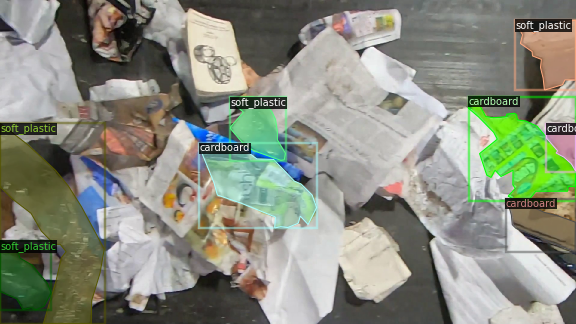

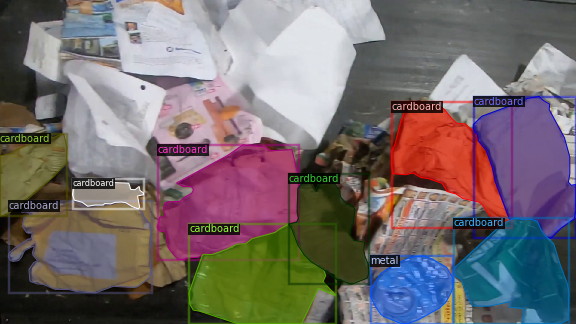

ZeroWasteAug dataset


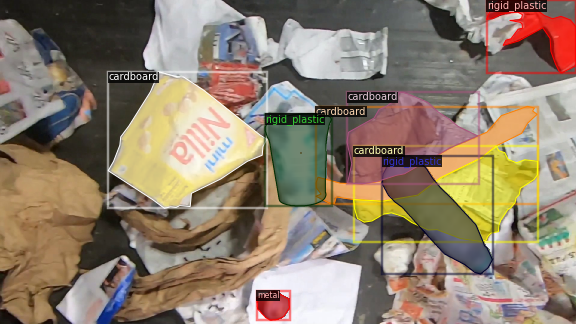

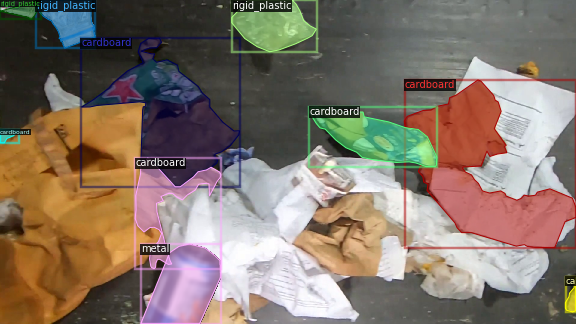

In [7]:
import random
from detectron2.utils.visualizer import Visualizer

print("ZeroWaste-f dataset")
for d in random.sample(dataset_dicts_train, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=zerowaste_train_metadata, scale=0.3)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

print("ZeroWasteAug dataset")
for d in random.sample(dataset_aug_dicts_train, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=zerowaste_train_metadata, scale=0.3)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Obtaining model
- MyTrainer() class - implements trainer for detectron2 library with validation during training
- Training Mask R-CNN on ZeroWaste dataset and evaluation
- Training Mask R-CNN on ZeroWasteAug dataset and evaluation

### MyTrainer() class

Class that implements validation during training
<!-- Evaluation tutorials:

 https://pallawi-ds.medium.com/detectron2-evaluation-cocoevaluator-9f1ab0236d4c


Drugi tutorial pokazuje jak stworzyc klase Trainera ktora bedzie ewaluowała model w trakcie treningu ( co x iteracji )

https://eidos-ai.medium.com/training-on-detectron2-with-a-validation-set-and-plot-loss-on-it-to-avoid-overfitting-6449418fbf4e -->

In [12]:
from detectron2.engine.hooks import HookBase
from detectron2.evaluation import inference_context
from detectron2.utils.logger import log_every_n_seconds
from detectron2.data import DatasetMapper, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
import detectron2.utils.comm as comm
import torch
import time
import datetime
import logging

class LossEvalHook(HookBase):
    def __init__(self, eval_period, model, data_loader):
        self._model = model
        self._period = eval_period
        self._data_loader = data_loader
    
    def _do_loss_eval(self):
        # Copying inference_on_dataset from evaluator.py
        total = len(self._data_loader)
        num_warmup = min(5, total - 1)
            
        start_time = time.perf_counter()
        total_compute_time = 0
        losses = []
        for idx, inputs in enumerate(self._data_loader):            
            if idx == num_warmup:
                start_time = time.perf_counter()
                total_compute_time = 0
            start_compute_time = time.perf_counter()
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            total_compute_time += time.perf_counter() - start_compute_time
            iters_after_start = idx + 1 - num_warmup * int(idx >= num_warmup)
            seconds_per_img = total_compute_time / iters_after_start
            if idx >= num_warmup * 2 or seconds_per_img > 5:
                total_seconds_per_img = (time.perf_counter() - start_time) / iters_after_start
                eta = datetime.timedelta(seconds=int(total_seconds_per_img * (total - idx - 1)))
                log_every_n_seconds(
                    logging.INFO,
                    "Loss on Validation  done {}/{}. {:.4f} s / img. ETA={}".format(
                        idx + 1, total, seconds_per_img, str(eta)
                    ),
                    n=5,
                )
            loss_batch = self._get_loss(inputs)
            losses.append(loss_batch)
        mean_loss = np.mean(losses)
        self.trainer.storage.put_scalar('validation_loss', mean_loss)
        comm.synchronize()

        return losses
            
    def _get_loss(self, data):
        # How loss is calculated on train_loop 
        metrics_dict = self._model(data)
        metrics_dict = {
            k: v.detach().cpu().item() if isinstance(v, torch.Tensor) else float(v)
            for k, v in metrics_dict.items()
        }
        total_losses_reduced = sum(loss for loss in metrics_dict.values())
        return total_losses_reduced
        
        
    def after_step(self):
        next_iter = self.trainer.iter + 1
        is_final = next_iter == self.trainer.max_iter
        if is_final or (self._period > 0 and next_iter % self._period == 0):
            self._do_loss_eval()
        self.trainer.storage.put_scalars(timetest=12)




class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
                     
    def build_hooks(self):
        hooks = super().build_hooks()
        hooks.insert(-1,LossEvalHook(
            cfg.TEST.EVAL_PERIOD,
            self.model,
            build_detection_test_loader(
                self.cfg,
                self.cfg.DATASETS.TEST[0],
                DatasetMapper(self.cfg,True)
            )
        ))
        return hooks

## Training Mask R-CNN - 1000 iters on ZeroWaste-f


### Creating cfg (detectron2 configuration)

In [9]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(
    "/content/zerowaste/detectron2/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"
)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # 4 classes (cardbord, sof_plastic, rigid_plastic, metal)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x/138205316/model_final_a3ec72.pkl"  # initialize from model zoo

cfg.DATASETS.TRAIN = ("zerowaste_train",)
cfg.DATASETS.TEST = ("zerowaste_val",) 

cfg.TEST.EVAL_PERIOD = 500
cfg.TEST.DETECTIONS_PER_IMAGE = 30

cfg.SOLVER.MAX_ITER = ( 1000 )
cfg.SOLVER.BASE_LR = 0.001

cfg.SOLVER.IMS_PER_BATCH = 6

cfg.DATALOADER.NUM_WORKERS = 0

cfg.OUTPUT_DIR="/content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output"

# with open("/content/drive/MyDrive/inzynierka/maskrcnn/config/custom_congif_zerowaste_mask_rcnn_R_101_FPN_3x.yaml", "w") as f:
#     f.write(cfg.dump())

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

### Begin training

In [ ]:
trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[01/07 11:22:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a3ec72.pkl: 254MB [00:26, 9.62MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[01/07 11:22:46 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[01/07 11:26:08 d2.utils.events]:  eta: 2:36:40  iter: 19  total_loss: 2.787  loss_cls: 1.647  loss_box_reg: 0.3106  loss_mask: 0.6935  loss_rpn_cls: 0.141  loss_rpn_loc: 0.03896  time: 9.6538  data_time: 7.0952  lr: 1.9981e-05  max_mem: 10930M
[01/07 11:29:23 d2.utils.events]:  eta: 2:34:39  iter: 39  total_loss: 2.37  loss_cls: 1.221  loss_box_reg: 0.3377  loss_mask: 0.6856  loss_rpn_cls: 0.1132  loss_rpn_loc: 0.03562  time: 9.6982  data_time: 7.0917  lr: 3.9961e-05  max_mem: 10930M
[01/07 11:32:40 d2.utils.events]:  eta: 2:31:03  iter: 59  total_loss: 1.865  loss_cls: 0.7172  loss_box_reg: 0.3504  loss_mask: 0.6679  loss_rpn_cls: 0.07727  loss_rpn_loc: 0.03402  time: 9.7624  data_time: 7.2384  lr: 5.9941e-05  max_mem: 10930M
[01/07 11:35:53 d2.utils.events]:  eta: 2:27:51  iter: 79  total_loss: 1.697  loss_cls: 0.5178  loss_box_reg: 0.4281  loss_mask: 0.6396  loss_rpn_cls: 0.07736  loss_rpn_loc: 0.03657  time: 9.7247  data_time: 6.9539  lr: 7.9921e-05  max_mem: 10930M
[01/07 11:39:0

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output'

### Model evaluation on test dataset

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("zerowaste_test", )
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator("zerowaste_test", output_dir=cfg.OUTPUT_DIR)
test_loader = build_detection_test_loader(cfg, "zerowaste_test")
print(inference_on_dataset(predictor.model, test_loader, evaluator))

[01/07 14:16:09 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/inzynierka/maskrcnn/output/model_final.pth ...
[01/07 14:16:10 d2.data.datasets.coco]: Loaded 929 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/test/labels.json
[01/07 14:16:10 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/07 14:16:10 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/07 14:16:10 d2.data.common]: Serializing 929 elements to byte tensors and concatenating them all ...
[01/07 14:16:10 d2.data.common]: Serialized dataset takes 2.82 MiB
[01/07 14:16:10 d2.evaluation.evaluator]: Start inference on 929 batches
[01/07 14:16:16 d2.evaluation.evaluator]: Inference done 11/929. Dataloading: 0.1198 s/iter. Inference: 0.1774 s/iter. 

#### Addtional evaluation on ZeroWasteAug test dataset

So that we know how out model detects classes "rigid_plastic" and "metal"

In [ ]:
cfg.DATASETS.TEST = ("zerowaste_aug_test", )
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator("zerowaste_aug_test", output_dir=cfg.OUTPUT_DIR)
test_loader = build_detection_test_loader(cfg, "zerowaste_aug_test")
print(inference_on_dataset(predictor.model, test_loader, evaluator))

[01/07 14:24:05 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/inzynierka/maskrcnn/output/model_final.pth ...
[01/07 14:24:07 d2.data.datasets.coco]: Loaded 929 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/test/labels.json
[01/07 14:24:07 d2.data.build]: Distribution of instances among all 4 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| rigid_plastic | 1207         | cardboard  | 3428         |   metal    | 1264         |
| soft_plastic  | 1236         |            |              |            |              |
|     total     | 7135         |            |              |            |              |
[01/07 14:24:07 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample

## Resuming training on ZeroWasteAug, 1500 more iters

In [9]:
# Resuming training so we need to copy last checkpoint since we change output folder -> output_zerowasteaug
!cp "/content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output/events.out.tfevents.1673090537.8c8b6a2bef07.1635.0" /content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output_zerowasteaug_resumeFalse
!cp "/content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output/last_checkpoint" /content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output_zerowasteaug_resumeFalse
!cp "/content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output/metrics.json" /content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output_zerowasteaug_resumeFalse
!cp "/content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output/model_final.pth" /content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output_zerowasteaug_resumeFalse

In [7]:
cfg = get_cfg()
cfg.merge_from_file(
    "/content/zerowaste/detectron2/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"
)
cfg.OUTPUT_DIR="/content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output_zerowasteaug"

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # 4 classes (cardbord, sof_plastic, rigid_plastic, metal)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

cfg.DATASETS.TRAIN = ("zerowaste_aug_train",)
cfg.DATASETS.TEST = ("zerowaste_val",) 

cfg.TEST.EVAL_PERIOD = 500
cfg.TEST.DETECTIONS_PER_IMAGE = 30

cfg.SOLVER.MAX_ITER = ( 1000 )
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.IMS_PER_BATCH = 6

cfg.DATALOADER.NUM_WORKERS = 0

In [ ]:
trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[01/09 16:20:09 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[01/09 16:21:30 d2.utils.events]:  eta: 0:56:03  iter: 19  total_loss: 1.11  loss_cls: 0.4526  loss_box_reg: 0.3116  loss_mask: 0.2457  loss_rpn_cls: 0.06374  loss_rpn_loc: 0.03468  time: 3.4952  data_time: 1.0030  lr: 1.9981e-05  max_mem: 11994M
[01/09 16:22:40 d2.utils.events]:  eta: 0:55:05  iter: 39  total_loss: 1.098  loss_cls: 0.4444  loss_box_reg: 0.3225  loss_mask: 0.2363  loss_rpn_cls: 0.06413  loss_rpn_loc: 0.03459  time: 3.4978  data_time: 0.9470  lr: 3.9961e-05  max_mem: 11994M
[01/09 16:23:49 d2.utils.events]:  eta: 0:54:12  iter: 59  total_loss: 1.119  loss_cls: 0.4512  loss_box_reg: 0.3246  loss_mask: 0.2466  loss_rpn_cls: 0.04753  loss_rpn_loc: 0.03568  time: 3.4935  data_time: 0.9307  lr: 5.9941e-05  max_mem: 11994M
[01/09 16:25:00 d2.utils.events]:  eta: 0:53:13  iter: 79  total_loss: 1.114  loss_cls: 0.4307  loss_box_reg: 0.3451  loss_mask: 0.2581  loss_rpn_cls: 0.04902  loss_rpn_loc: 0.03784  time: 3.4995  data_time: 0.9321  lr: 7.9921e-05  max_mem: 11994M
[01/09 16

In [9]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("zerowaste_test", )
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator("zerowaste_test", output_dir=cfg.OUTPUT_DIR)
test_loader = build_detection_test_loader(cfg, "zerowaste_test")
print(inference_on_dataset(predictor.model, test_loader, evaluator))

[01/10 19:50:18 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output_zerowasteaug/model_final.pth ...
[01/10 19:50:20 d2.data.datasets.coco]: Loaded 929 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/test/labels.json
[01/10 19:50:20 d2.data.build]: Distribution of instances among all 4 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| rigid_plastic | 315          | cardboard  | 3449         |   metal    | 63           |
| soft_plastic  | 1250         |            |              |            |              |
|     total     | 5077         |            |              |            |              |
[01/10 19:50:20 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShorte

/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[01/10 19:50:31 d2.evaluation.evaluator]: Inference done 1/929. Dataloading: 5.0495 s/iter. Inference: 6.1728 s/iter. Eval: 0.1683 s/iter. Total: 11.3932 s/iter. ETA=2:56:12
[01/10 19:50:41 d2.evaluation.evaluator]: Inference done 11/929. Dataloading: 0.5062 s/iter. Inference: 0.1729 s/iter. Eval: 0.1799 s/iter. Total: 0.8590 s/iter. ETA=0:13:08
[01/10 19:50:46 d2.evaluation.evaluator]: Inference done 17/929. Dataloading: 0.5184 s/iter. Inference: 0.1722 s/iter. Eval: 0.1616 s/iter. Total: 0.8525 s/iter. ETA=0:12:57
[01/10 19:50:51 d2.evaluation.evaluator]: Inference done 23/929. Dataloading: 0.5396 s/iter. Inference: 0.1723 s/iter. Eval: 0.1566 s/iter. Total: 0.8691 s/iter. ETA=0:13:07
[01/10 19:50:57 d2.evaluation.evaluator]: Inference done 29/929. Dataloading: 0.5539 s/iter. Inference: 0.1724 s/iter. Eval: 0.1539 s/iter. Total: 0.8806 s/iter. ETA=0:13:12
[01/10 19:51:02 d2.evaluation.evaluator]: Inference done 35/929. Dataloading: 0.5489 s/iter. Inference: 0.1727 s/iter. Eval: 0.151

In [14]:
cfg.DATASETS.TEST = ("zerowaste_val",) 
cfg.SOLVER.MAX_ITER = ( 1500 )
cfg.SOLVER.BASE_LR = 0.00025
trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[01/10 20:19:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [15]:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output_zerowasteaug"

Output hidden; open in https://colab.research.google.com to view.

### Model evaluation

#### Evaluation on ZeroWaste test dataset

In [16]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("zerowaste_test", )
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator("zerowaste_test", output_dir=cfg.OUTPUT_DIR)
test_loader = build_detection_test_loader(cfg, "zerowaste_test")
print(inference_on_dataset(predictor.model, test_loader, evaluator))

[01/10 21:13:15 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output_zerowasteaug/model_final.pth ...
[01/10 21:13:16 d2.data.datasets.coco]: Loaded 929 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/test/labels.json
[01/10 21:13:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/10 21:13:16 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/10 21:13:16 d2.data.common]: Serializing 929 elements to byte tensors and concatenating them all ...
[01/10 21:13:16 d2.data.common]: Serialized dataset takes 2.82 MiB
[01/10 21:13:16 d2.evaluation.evaluator]: Start inference on 929 batches
[01/10 21:13:21 d2.evaluation.evaluator]: Inference done 11/929. Dataloading: 0.1107 s/i

#### Evaluation on ZeroWasteAug test dataset

In [17]:
cfg.DATASETS.TEST = ("zerowaste_aug_test", )
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator("zerowaste_aug_test", output_dir=cfg.OUTPUT_DIR)
test_loader = build_detection_test_loader(cfg, "zerowaste_aug_test")
print(inference_on_dataset(predictor.model, test_loader, evaluator))

[01/10 21:19:59 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output_zerowasteaug/model_final.pth ...
[01/10 21:20:01 d2.data.datasets.coco]: Loaded 929 images in COCO format from /content/drive/MyDrive/inzynierka/datasets/zerowaste-aug/test/labels.json
[01/10 21:20:02 d2.data.build]: Distribution of instances among all 4 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| rigid_plastic | 1207         | cardboard  | 3428         |   metal    | 1264         |
| soft_plastic  | 1236         |            |              |            |              |
|     total     | 7135         |            |              |            |              |
[01/10 21:20:02 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(8

### Saving model

In [ ]:
# We don't actually need model as torch Module so I skip this part 

# from detectron2.checkpoint import DetectionCheckpointer
# from detectron2.modeling import build_model

# model = build_model(cfg)  # returns a torch.nn.Module
# checkpointer = DetectionCheckpointer(model, save_dir="drive/MyDrive/studia/inzynierka/Detection/output")
# checkpointer.save("model-maskrcnn")  # save to output/model_999.pth

# Doing inference

### Predictor

In [25]:
cfg.OUTPUT_DIR="/content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output" # Using our best model

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("zerowaste_test", )
predictor = DefaultPredictor(cfg)

[01/10 21:39:53 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output/model_final.pth ...


## Inference on chosen images:



In [40]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("zerowaste_test", )
predictor = DefaultPredictor(cfg)

[01/10 22:14:21 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/inzynierka/project/detection/maskrcnn/output/model_final.pth ...


In [41]:
for d in dataset_dicts_test[816:820]:  
    print(d["file_name"].split('/')[-1], '-', "Prediction | GT")
    im = cv2.imread(d["file_name"])
    visualizer_pred = Visualizer(im[:, :, ::-1],
                   metadata=zerowaste_train_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    visualizer_gt = Visualizer(im[:, :, ::-1],
                   metadata=zerowaste_train_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    outputs = predictor(im)

    v_gt = visualizer_gt.draw_dataset_dict(d)
    img_gt = v_gt.get_image()[:, :, ::-1]
    # cv2_imshow(v_gt.get_image()[:, :, ::-1])
    v_pred = visualizer_pred.draw_instance_predictions(outputs["instances"].to("cpu"))
    img_pred = v_pred.get_image()[:, :, ::-1]
    # cv2_imshow(v_pred.get_image()[:, :, ::-1])
    final_img = cv2.hconcat([img_pred, img_gt])
    cv2_imshow(final_img)

for d in dataset_dicts_test[312:316]:   
    print(d["file_name"].split('/')[-1], '-', "Prediction | GT")
    im = cv2.imread(d["file_name"])
    visualizer_pred = Visualizer(im[:, :, ::-1],
                   metadata=zerowaste_train_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    visualizer_gt = Visualizer(im[:, :, ::-1],
                   metadata=zerowaste_train_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    outputs = predictor(im)

    v_gt = visualizer_gt.draw_dataset_dict(d)
    img_gt = v_gt.get_image()[:, :, ::-1]
    # cv2_imshow(v_gt.get_image()[:, :, ::-1])
    v_pred = visualizer_pred.draw_instance_predictions(outputs["instances"].to("cpu"))
    img_pred = v_pred.get_image()[:, :, ::-1]
    # cv2_imshow(v_pred.get_image()[:, :, ::-1])
    final_img = cv2.hconcat([img_pred, img_gt])
    cv2_imshow(final_img)

Output hidden; open in https://colab.research.google.com to view.

#### ZeroWasteAug test

In [34]:
for d in dataset_aug_dicts_test[312:316]:   
    print(d["file_name"].split('/')[-1], '-', "Prediction | GT")
    im = cv2.imread(d["file_name"])
    visualizer_pred = Visualizer(im[:, :, ::-1],
                   metadata=zerowaste_train_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    visualizer_gt = Visualizer(im[:, :, ::-1],
                   metadata=zerowaste_train_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    outputs = predictor(im)

    v_gt = visualizer_gt.draw_dataset_dict(d)
    img_gt = v_gt.get_image()[:, :, ::-1]
    # cv2_imshow(v_gt.get_image()[:, :, ::-1])
    v_pred = visualizer_pred.draw_instance_predictions(outputs["instances"].to("cpu"))
    img_pred = v_pred.get_image()[:, :, ::-1]
    # cv2_imshow(v_pred.get_image()[:, :, ::-1])
    final_img = cv2.hconcat([img_pred, img_gt])
    cv2_imshow(final_img)

Output hidden; open in https://colab.research.google.com to view.

## Measuring inference time

- This experiment was done before training. In order to decide which version of model should be used in tracking system (backbone ResNet-50 or ResNet-101), it was crucial to measure inference time. 

### ResNet-101 based Mask R-CNN results: ~ 0.19s

In [ ]:
import time
import statistics
times = []

for d in random.sample(dataset_dicts_test, 10):
    
    im = cv2.imread(d["file_name"])
    start = time.time()
    outputs = predictor(im)
    stop = time.time()
    times.append(stop-start)

print(times)
print(statistics.mean(times))


[0.23132944107055664, 0.20965027809143066, 0.18391132354736328, 0.18521738052368164, 0.18838071823120117, 0.18322157859802246, 0.18866348266601562, 0.18403935432434082, 0.18512344360351562, 0.1852715015411377]
0.19248085021972655


### ResNet-50 based Mask R-CNN results: ~ 0.17s


In [ ]:
import time
import statistics
times = []

for d in random.sample(dataset_dicts_test, 10):
    
    im = cv2.imread(d["file_name"])
    start = time.time()
    outputs = predictor(im)
    stop = time.time()
    times.append(stop-start)

print(times)
print(statistics.mean(times))

[0.20227336883544922, 0.1508188247680664, 0.1997687816619873, 0.15381193161010742, 0.20038843154907227, 0.1452808380126953, 0.17739176750183105, 0.17589163780212402, 0.15177464485168457, 0.14582395553588867]
0.17032241821289062


Inference time was very similar that's why Mask R-CNN with ResNet-101 backbone was used since it has more chance of getting better detection results

## Visualization of predictions

In [39]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("zerowaste_test", )
predictor = DefaultPredictor(cfg)

from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts_test, 4):   
    print(d["file_name"].split('/')[-1], '-', "Prediction | GT")
    im = cv2.imread(d["file_name"])
    visualizer_pred = Visualizer(im[:, :, ::-1],
                   metadata=zerowaste_train_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    visualizer_gt = Visualizer(im[:, :, ::-1],
                   metadata=zerowaste_train_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    outputs = predictor(im)

    v_gt = visualizer_gt.draw_dataset_dict(d)
    img_gt = v_gt.get_image()[:, :, ::-1]
    # cv2_imshow(v_gt.get_image()[:, :, ::-1])
    v_pred = visualizer_pred.draw_instance_predictions(outputs["instances"].to("cpu"))
    img_pred = v_pred.get_image()[:, :, ::-1]
    # cv2_imshow(v_pred.get_image()[:, :, ::-1])
    final_img = cv2.hconcat([img_pred, img_gt])
    cv2_imshow(final_img)

Output hidden; open in https://colab.research.google.com to view.

01_frame_026400.PNG - Prediction | GT


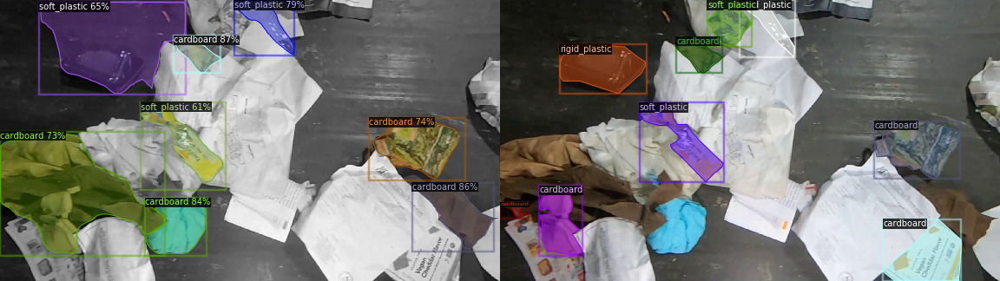

01_frame_046900.PNG - Prediction | GT


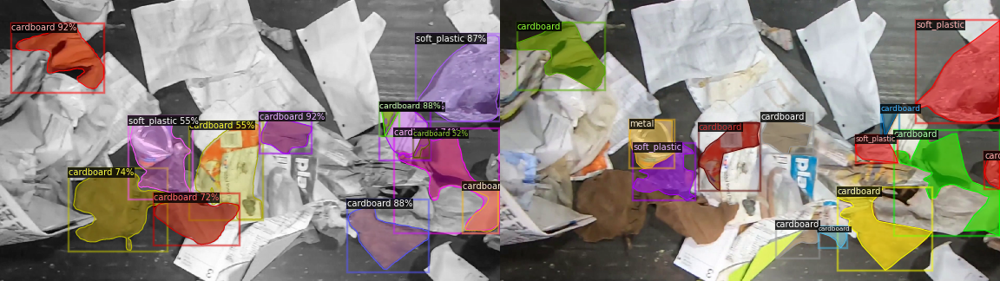

05_frame_000671.PNG - Prediction | GT


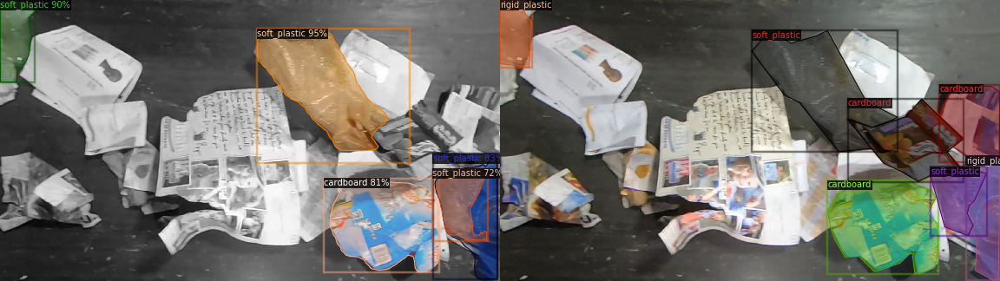

08_frame_000421.PNG - Prediction | GT


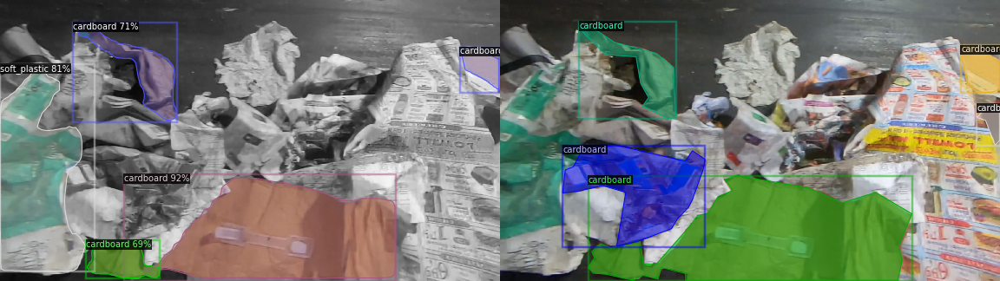

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts_test, 4):   
    print(d["file_name"].split('/')[-1], '-', "Prediction | GT")
    im = cv2.imread(d["file_name"])
    visualizer_pred = Visualizer(im[:, :, ::-1],
                   metadata=zerowaste_train_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    visualizer_gt = Visualizer(im[:, :, ::-1],
                   metadata=zerowaste_train_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    outputs = predictor(im)

    v_gt = visualizer_gt.draw_dataset_dict(d)
    img_gt = v_gt.get_image()[:, :, ::-1]
    # cv2_imshow(v_gt.get_image()[:, :, ::-1])
    v_pred = visualizer_pred.draw_instance_predictions(outputs["instances"].to("cpu"))
    img_pred = v_pred.get_image()[:, :, ::-1]
    # cv2_imshow(v_pred.get_image()[:, :, ::-1])
    final_img = cv2.hconcat([img_pred, img_gt])
    cv2_imshow(final_img)

## Wczytanie modelu

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(
    "./zerowaste/detectron2/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
)
# cfg.DATASETS.TRAIN = ("zerowaste_train",)
# cfg.DATASETS.TEST = ("zerowaste_val",) 
# cfg.TEST.EVAL_PERIOD = 100
cfg.DATALOADER.NUM_WORKERS = 2
# cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/studia/inzynierka/Detection/output/maskrcnn/model1-maskrcnn-2500iters.pth"
# cfg.SOLVER.IMS_PER_BATCH = 2
# cfg.SOLVER.BASE_LR = 0.001
# cfg.SOLVER.MAX_ITER = (
#     1000
# )  # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (
    32
)  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # 4 classes (cardbord, sof_plastic, rigid_plastic, metal)
cfg.OUTPUT_DIR="drive/MyDrive/studia/inzynierka/Detection/output/"

In [ ]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)

[11/15 12:17:29 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

In [ ]:
im = cv2.imread("/content/drive/MyDrive/studia/inzynierka/datasets/zerowaste-f-final/splits_final_deblurred/test/data/01_frame_000680.PNG")
preds = predictor(im)

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


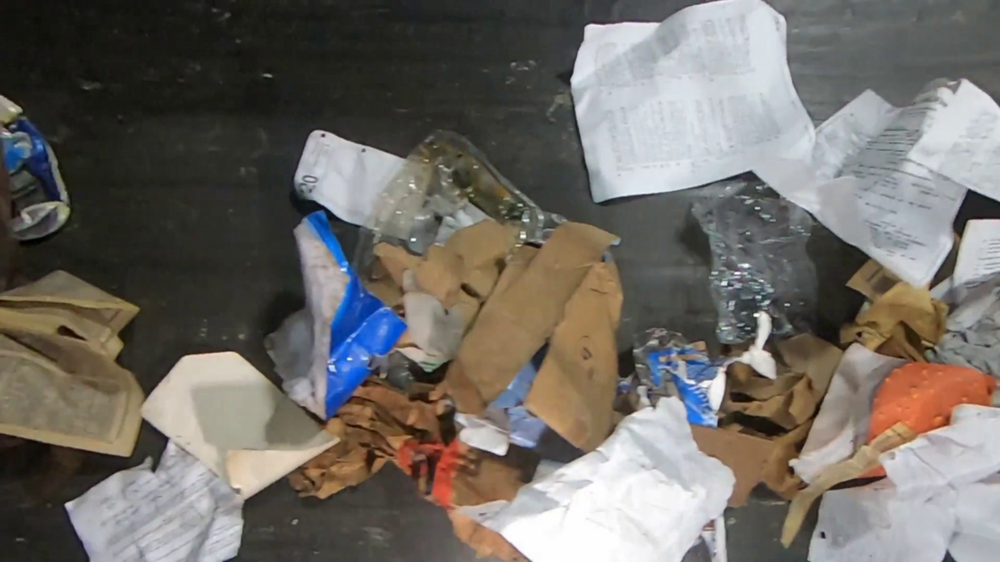

In [ ]:
cv2_imshow(im)

# Arch

In [ ]:
model = build_model(cfg)  # returns a torch.nn.Module
checkpointer = DetectionCheckpointer(model, save_dir="/content/drive/MyDrive/inzynierka/maskrcnn/output")
checkpointer.save("model1-maskrcnn-101-500iters")  # save to output/model_999.pth

In [ ]:
trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[01/05 17:08:53 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[01/05 17:09:00 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[01/05 17:10:13 d2.utils.events]:  eta: 0:10:33  iter: 19  total_loss: 2.936  loss_cls: 0.7773  loss_box_reg: 0.1909  loss_mask: 0.6926  loss_rpn_cls: 1.008  loss_rpn_loc: 0.083  time: 3.5494  data_time: 1.1425  lr: 0.00023976  max_mem: 10593M
[01/05 17:11:24 d2.utils.events]:  eta: 0:09:26  iter: 39  total_loss: 1.503  loss_cls: 0.3501  loss_box_reg: 0.2491  loss_mask: 0.6877  loss_rpn_cls: 0.1663  loss_rpn_loc: 0.05095  time: 3.5567  data_time: 1.1781  lr: 0.00048951  max_mem: 10593M
[01/05 17:12:35 d2.utils.events]:  eta: 0:08:15  iter: 59  total_loss: 1.516  loss_cls: 0.3708  loss_box_reg: 0.3068  loss_mask: 0.679  loss_rpn_cls: 0.1151  loss_rpn_loc: 0.0455  time: 3.5635  data_time: 1.1360  lr: 0.00073926  max_mem: 10593M


Kontynuacja treningu

In [ ]:
cfg.SOLVER.MAX_ITER = (
    2500
) 
trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[01/03 20:04:47 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res